In [ ]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities.
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

# Properly install detectron2. (Please do not install twice in both ways)
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 KB 6.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyyaml: filename=PyYAML-5.1-cp38-cp38-linux_x86_64.whl size=44089 sha256=24ddd869a86f0fcda3780ac77e03fd14036d4b90f9b4d82053c4814c769c7d56
  Stored in directory: /root/.cache/pip/wheels/52/dd/2b/10ff8b0ac81b93946bb5fb9e6749bae2dac246506c8774e6cf
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0
    Uninstalling PyYAML-6.0:
      Successfully uninstalled PyYAML-6.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask 2022.2.1 requires pyyaml>=5.3.1, but you have pyyaml 5.1 which is incompatible.
Cloning into 'detectron2'...
remote: Enumerating objects: 14782, done.
remote: Cou

In [ ]:
# Setup logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# Common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# Detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [ ]:
!curl -L "https://app.roboflow.com/ds/6w5pxz2kS6?key=EXYBr2F3OH" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   892  100   892    0     0    361      0  0:00:02  0:00:02 --:--:--   361
100 5404k  100 5404k    0     0  2012k      0  0:00:02  0:00:02 --:--:-- 78.4M
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
   creating: test/
 extracting: test/Screenshot-2023-01-22-at-10-51-58-PM_png.rf.b0fbfd8acd58d5acef2d41a07ebad6c3.jpg  
 extracting: test/Screenshot-2023-01-22-at-10-54-11-PM_png.rf.9b30d8b77ef8ad4d75b9a7ae3ae87ac8.jpg  
 extracting: test/Screenshot-2023-01-22-at-10-54-14-PM_png.rf.4bc470a6a6d2b1a46be53b98ab1064bb.jpg  
 extracting: test/Screenshot-2023-01-22-at-10-54-23-PM_png.rf.5f3935b8c66257149bc1e26a7f9ef077.jpg  
 extracting: test/Screenshot-2023-01-22-at-10-54-25-PM_png.rf.c7631598189dfa1320b991517a215407.jpg  
 extracting: test/Screenshot-2023-01-22-at-10-55-12-PM_png.rf

In [ ]:
# Remove dataset if already registered

# DatasetCatalog.remove("my_dataset_train")
# DatasetCatalog.remove("my_dataset_val")
# DatasetCatalog.remove("my_dataset_test")

In [ ]:
# Register dataset

from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/train/_annotations.coco.json", "/content/train")
register_coco_instances("my_dataset_val", {}, "/content/valid/_annotations.coco.json", "/content/valid")
register_coco_instances("my_dataset_test", {}, "/content/test/_annotations.coco.json", "/content/test")

WARNING [01/31 22:00:52 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/31 22:00:52 d2.data.datasets.coco]: Loaded 864 images in COCO format from /content/train/_annotations.coco.json


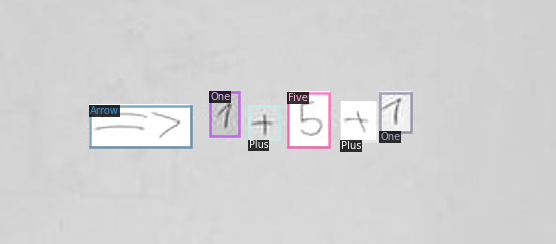

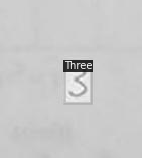

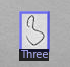

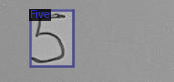

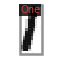

In [ ]:
# Visualize the training data

my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 5):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=1)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

In [ ]:
my_dataset_train_metadata

Metadata(evaluator_type='coco', image_root='/content/train', json_file='/content/train/_annotations.coco.json', name='my_dataset_train', thing_classes=['numbers-operands', 'Arrow', 'Five', 'Minus', 'One', 'Plus', 'Three'], thing_dataset_id_to_contiguous_id={0: 0, 1: 1, 2: 2, 3: 3, 4: 4, 5: 5, 6: 6})

In [ ]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_1x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_val",)

cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_1x.yaml")  # Faster RCNN 50 from Model Zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.0025  # Learning rate
cfg.SOLVER.MAX_ITER = 2200 
cfg.SOLVER.STEPS = [] 
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 7 

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[01/31 19:56:33 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[01/31 19:56:33 d2.engine.train_loop]: Starting training from iteration 0
[01/31 19:56:43 d2.utils.events]:  eta: 0:17:43  iter: 19  total_loss: 2.085  loss_cls: 1.826  loss_box_reg: 0.252  loss_rpn_cls: 0.01445  loss_rpn_loc: 0.0134  time: 0.4739  data_time: 0.0208  lr: 4.9952e-05  max_mem: 3051M
[01/31 19:56:51 d2.utils.events]:  eta: 0:15:50  iter: 39  total_loss: 0.9031  loss_cls: 0.599  loss_box_reg: 0.1771  loss_rpn_cls: 0.006414  loss_rpn_loc: 0.007206  time: 0.4498  data_time: 0.0075  lr: 9.9902e-05  max_mem: 3051M
[01/31 19:57:01 d2.utils.events]:  eta: 0:17:00  iter: 59  total_loss: 0.8099  loss_cls: 0.4006  loss_box_reg: 0.3946  loss_rpn_cls: 0.0341  loss_rpn_loc: 0.01684  time: 0.4601  data_time: 0.0071  lr: 0.00014985  max_mem: 3051M
[01/31 19:57:09 d2.utils.events]:  eta: 0:15:33  iter: 79  total_loss: 0.3837  loss_cls: 0.1915  loss_box_reg: 0.1896  loss_rpn_cls: 0.005625  loss_rpn_loc: 0.007824  time: 0.4505  data_time: 0.0098  lr: 0.0001998  max_mem: 3051M
[01/31 19:57:

In [ ]:
# Look at training curves in tensorboard
%load_ext tensorboard
%tensorboard --logdir output

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 7671), started 0:21:47 ago. (Use '!kill 7671' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
# Check if our model is saved in the output dir

!cd output && ls

events.out.tfevents.1675005501.be214309a416.1049.0  metrics.json
last_checkpoint					    model_final.pth


In [ ]:
# Use our trained model

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7
predictor = DefaultPredictor(cfg)

[01/31 20:15:16 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


In [ ]:
# Load an already trained model from google drive

# from google.colab import drive
# drive.mount('/content/gdrive', force_remount=True)

# # cfg = get_cfg()
# cfg.MODEL.WEIGHTS = "/content/gdrive/MyDrive/model_final.pth"  # path to the model we just trained
# cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
# predictor = DefaultPredictor(cfg)

WARNING [01/31 20:15:25 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/31 20:15:25 d2.data.datasets.coco]: Loaded 44 images in COCO format from /content/test/_annotations.coco.json


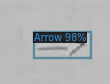

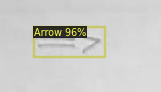

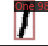

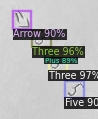

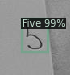

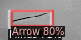

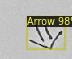

In [ ]:
# Check how our model have done on the test set

from detectron2.utils.visualizer import ColorMode

my_dataset_test_metadata = MetadataCatalog.get("my_dataset_test")
dataset_dicts = DatasetCatalog.get("my_dataset_test")

for d in random.sample(dataset_dicts, 7):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=my_dataset_test_metadata, 
                   scale=0.8
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

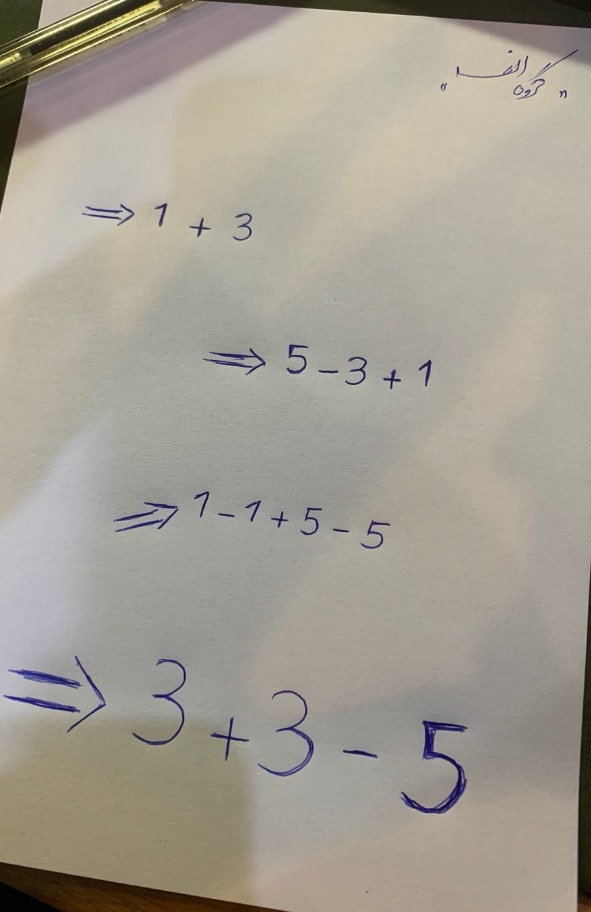

In [ ]:
# Our model has done pretty well on the test set, now let's test it on the image given in the pdf file

!wget https://gcdnb.pbrd.co/images/dKdILFzTEX1x.jpg -q -O input.jpg
infer = cv2.imread("./input.jpg")
cv2_imshow(infer)

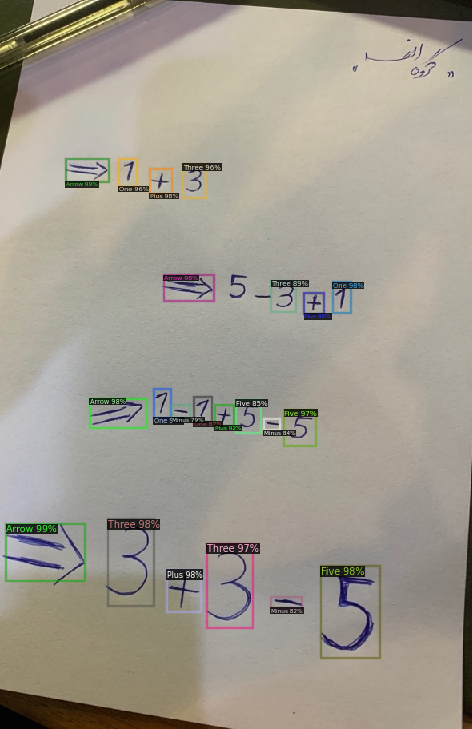

In [ ]:
# We can see that most of our elemets are detected sucessfully, that's good enough for our purpose.
# Let's divide each equation.

outputs = predictor(infer) 
v = Visualizer(infer[:, :, ::-1],
                   metadata=my_dataset_test_metadata, 
                   scale=0.8
    )
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

In [ ]:
# Get arrows indexes and save them in an array

detectedClassesList = outputs["instances"].__dict__['_fields']['pred_classes'].to("cpu").tolist()

arrowsIndexes = []

for i in range(len(detectedClassesList)):
    if detectedClassesList[i] == 1:
        arrowsIndexes.append(i)

print(arrowsIndexes)

[0, 1, 6, 8]


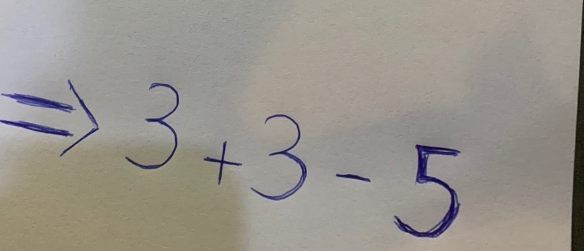

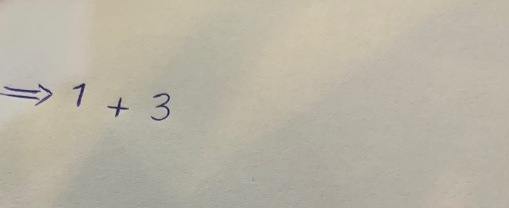

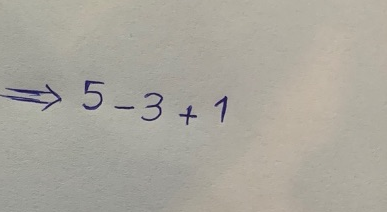

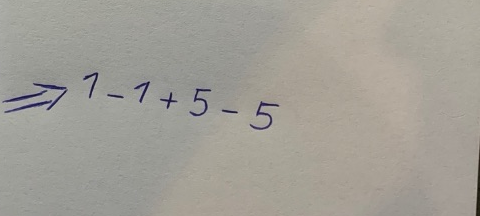

In [ ]:
# Use arrows to crop out the whole equation
# Run the prediction function on each equation and save them in "equationPredictions" array
# Save bouding box of each equation in "equationBoundingBoxes" array
# Save each equation itself in "separatedEquationImages" array

output_pred_boxes = outputs["instances"].pred_boxes

equationPredictions = []
separatedEquationImages = []
equationBoundingBoxes = []

for i, val in enumerate(output_pred_boxes.__iter__()):

  if i in arrowsIndexes:
    bb = val.cpu().numpy()
    y1 = int(bb[0])
    x1 = int(bb[1])
    y2 = int(bb[2])
    x2 = int(bb[3])

    equationBoundingBoxes.append([y1, x1 - 30, y2, x2 + 80])
    equation = infer[x1 - 80:x2 + 100, y1:infer.shape[1]]

    equationPredictions.append(predictor(equation))
    separatedEquationImages.append(equation)

    cv2_imshow(equation)

In [ ]:
# Dictionary for our classes

theDictList = ['numbers-operands',
 'Arrow', 
 'Five', 
 'Minus', 
 'One', 
 'Plus', 
 'Three'] 

In [ ]:
theNumList = ['numbers-operands',
 '', 
 '5', 
 '-', 
 '1', 
 '+', 
 '3'] 

3+3-5=1


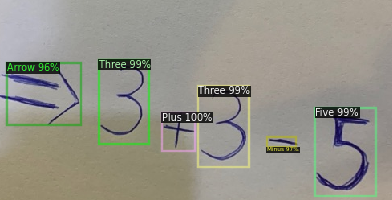

1+3=4


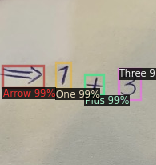

5-3+1=3


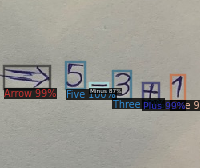

1-1+5-5=0


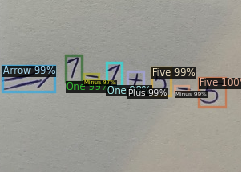

In [ ]:
results = []

for i in range(len(arrowsIndexes)):

  # For each equation get the bouding box and classes of each element
  output = equationPredictions[i]

  detectedBBList = output["instances"].__dict__['_fields']['pred_boxes'].__dict__['tensor'].to("cpu").tolist()

  detectedClassesList = output["instances"].__dict__['_fields']['pred_classes'].to("cpu").tolist()

  # Zip the bouding box and predicted element class together.
  # This step helps of with the next (sorting) step.
  zippedClassWithBB = list(zip(detectedClassesList, detectedBBList))

  # To be able to read the equation from left to right (LRT) we need to sort each class by the x coordinate
  # Because we have zipped the classes and bounding boxes, we can be sure that the order of the two lists remain correct.
  zippedClassWithBB.sort(key=lambda x: x[1])


  # Use the "equationToList" array to stick the elements of each equation togethter.
  equationToList = []

  for value in zippedClassWithBB:
    # Use the dictionary to transform classes to numbers
    # value[0] refers to the "classes list" in our zipped list
    equationToList.append(theNumList[value[0]])

  # Join the elements of the equation togethter. 
  # Use eval() to transform it to an executable math expression.
  results.append(eval("".join(equationToList)))
  print("".join(equationToList) + "=" + str(eval("".join(equationToList))))

  # Clean the list so it won't affect the next equation
  equationToList = []

  # Get the last element from the sorted list. This helps us adjust the equation bouding box.
  equationImage = separatedEquationImages[i]
  lastItem = zippedClassWithBB[-1][1]

  # Remove the extra space after the last element of the equation.
  resizedEquationImage = equationImage[0:-1, 0:int(lastItem[2])+20]
  # Adjust the bouding box of the whole equation.
  equationBoundingBoxes[i][2] = equationBoundingBoxes[i][2] + resizedEquationImage.shape[1] - 30
  
  v = Visualizer(resizedEquationImage[:, :, ::-1],
                   metadata=my_dataset_test_metadata, 
                   scale=0.8
    )
  out = v.draw_instance_predictions(output["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])


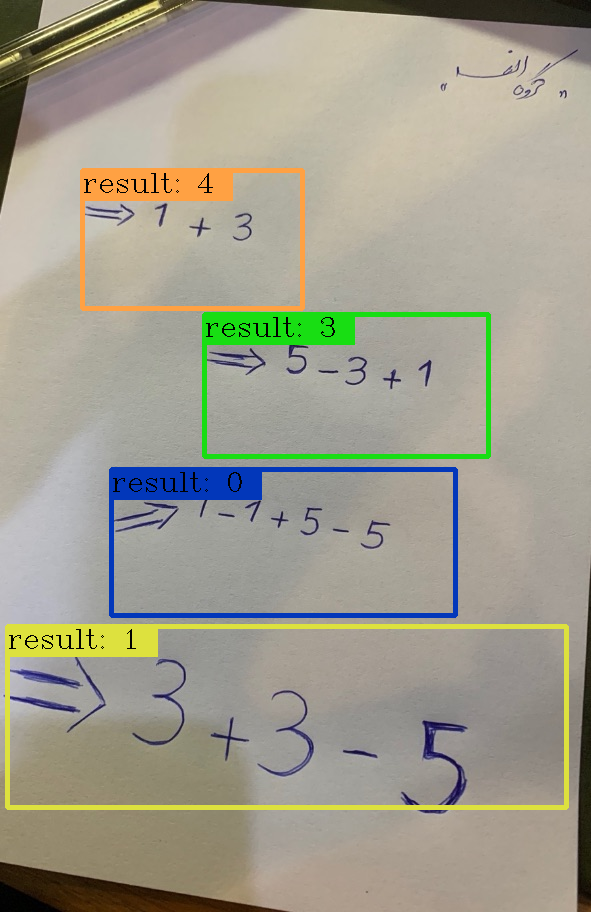

In [ ]:
# Using the bouding boxes and the results, we get the below output.

infer = cv2.imread("./input.jpg")

colors = [(62, 225, 221), (67, 161, 255), (19, 222, 24), (186, 55, 2)]

for i, val in enumerate(equationBoundingBoxes):
  cv2.rectangle(infer, pt1=(val[0], val[1]), pt2=(val[2], val[3]), color=colors[i], thickness=4)
  cv2.rectangle(infer, (val[0], val[1]), (val[0] + 150, val[1] + 30), colors[i], -1)
  cv2.putText(infer, f"result: {str(results[i])}", (val[0], val[1] + 22), cv2.FONT_HERSHEY_COMPLEX, 0.9, (0, 0, 0), 1)
  
cv2_imshow(infer)

In [ ]:
# If the model has done well, we can copy it to google drive and reuse it.

from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

!cp /content/output/model_final.pth /content/gdrive/MyDrive/

Mounted at /content/gdrive
